In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Flatten,Dense

In [2]:
img = image.load_img("/Users/mujeebkhan/dogs-vs-cats/train/Cats/cat.4.jpg")

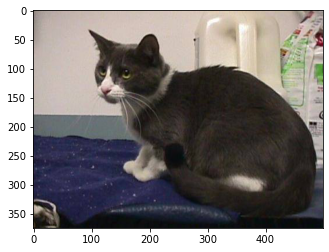

In [3]:
plt.imshow(img)

In [4]:
cv2.imread("/Users/mujeebkhan/dogs-vs-cats/train/Cats/cat.4.jpg").shape

(375, 499, 3)

In [5]:
train = ImageDataGenerator(rescale=1/255)
validation = ImageDataGenerator(rescale=1/255)

In [6]:
train_dataset= train.flow_from_directory('/Users/mujeebkhan/dogs-vs-cats/train',
        target_size=(150, 150),
        batch_size=5,
        class_mode='binary')  

Found 24598 images belonging to 2 classes.


In [7]:
validation_dataset = validation.flow_from_directory(
        '/Users/mujeebkhan/dogs-vs-cats/validation',
        target_size=(150, 150),
        batch_size=5,
        class_mode='binary')

Found 402 images belonging to 2 classes.


In [8]:
train_dataset.class_indices

{'Cats': 0, 'Dogs': 1}

In [9]:
train_dataset.classes

array([0, 0, 0, ..., 1, 1, 1], dtype=int32)

In [21]:
model = tf.keras.models.Sequential([ tf.keras.layers.Conv2D(16,(3,3), activation ='relu', input_shape=(150,150,3)),
                                   tf.keras.layers.MaxPooling2D(2,2),
                                   
                                   tf.keras.layers.Conv2D(32,(3,3), activation ='relu'),
                                   tf.keras.layers.MaxPooling2D(2,2),
                                   
                                   tf.keras.layers.Conv2D(64,(3,3), activation ='relu'),
                                   tf.keras.layers.MaxPooling2D(2,2),
                                   
                                   tf.keras.layers.Flatten(),
                                   
                                   tf.keras.layers.Dense(512,activation='relu'),
                                   tf.keras.layers.Dense(512,activation='relu'), 
                                   tf.keras.layers.Dense(1, activation ='sigmoid')
                                   ])

In [34]:
model.compile(optimizer=RMSprop(learning_rate=0.001),
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])

In [35]:
model_fit = model.fit(train_dataset,
                      steps_per_epoch=10,
                      epochs = 30,
                      validation_data=validation_dataset)

Epoch 1/30
10/10 [==============================] - 7s 601ms/step - loss: 0.6926 - accuracy: 0.5200 - val_loss: 0.7150 - val_accuracy: 0.5000
Epoch 2/30
10/10 [==============================] - 5s 546ms/step - loss: 0.7143 - accuracy: 0.4000 - val_loss: 0.6924 - val_accuracy: 0.5000
Epoch 3/30
10/10 [==============================] - 5s 546ms/step - loss: 0.6958 - accuracy: 0.4600 - val_loss: 0.6931 - val_accuracy: 0.5100
Epoch 4/30
10/10 [==============================] - 5s 543ms/step - loss: 0.7085 - accuracy: 0.4000 - val_loss: 0.6931 - val_accuracy: 0.5473
Epoch 5/30
10/10 [==============================] - 5s 550ms/step - loss: 0.6951 - accuracy: 0.4400 - val_loss: 0.6929 - val_accuracy: 0.5050
Epoch 6/30
10/10 [==============================] - 5s 535ms/step - loss: 0.6948 - accuracy: 0.4200 - val_loss: 0.6931 - val_accuracy: 0.5398
Epoch 7/30
10/10 [==============================] - 5s 553ms/step - loss: 0.6926 - accuracy: 0.4200 - val_loss: 0.7497 - val_accuracy: 0.5000
Epoch 

In [36]:
dir_path = '/Users/mujeebkhan/dogs-vs-cats/test'

In [37]:
validation_dataset.class_indices

{'Cats': 0, 'Dogs': 1}

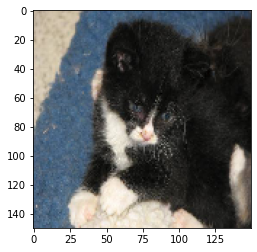

DOG


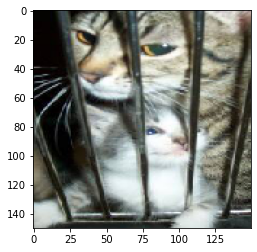

DOG


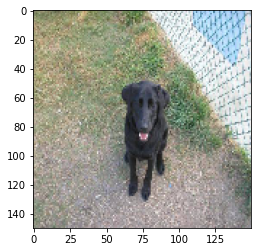

DOG


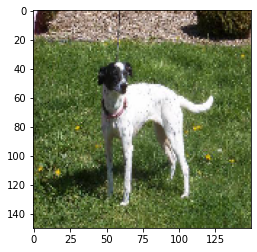

DOG


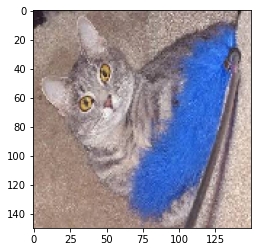

DOG


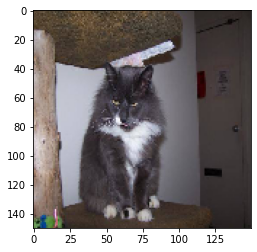

DOG


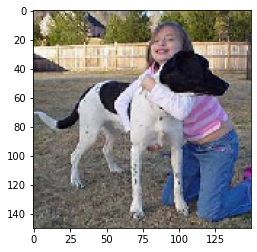

DOG


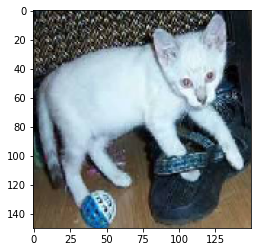

DOG


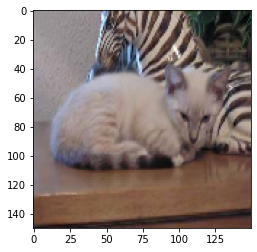

DOG


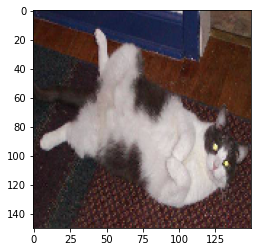

DOG


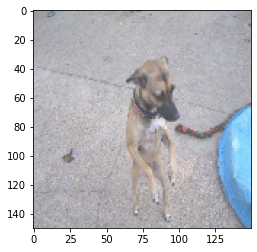

DOG


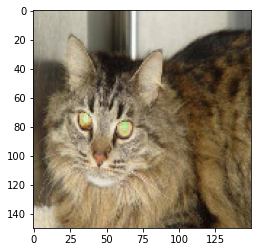

DOG


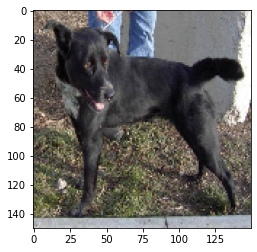

DOG


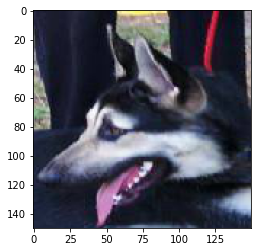

DOG


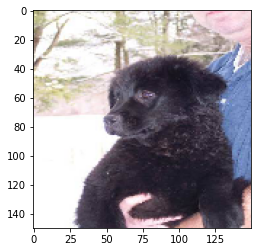

DOG


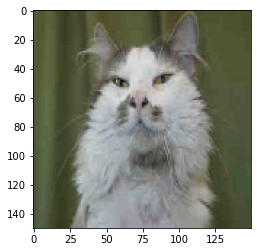

DOG


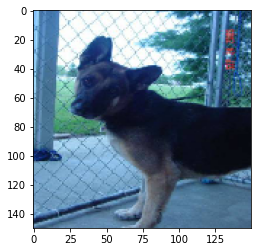

CAT


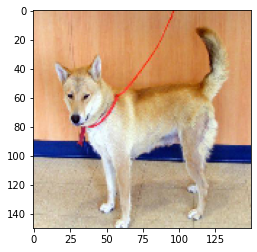

DOG


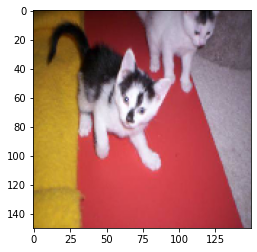

DOG


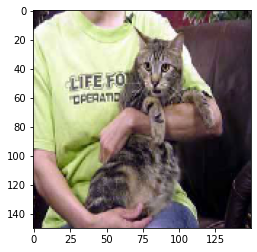

DOG


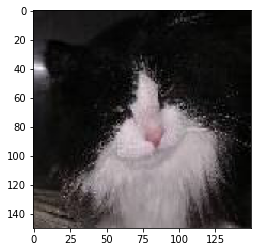

DOG


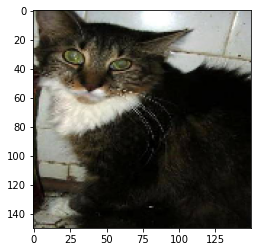

DOG


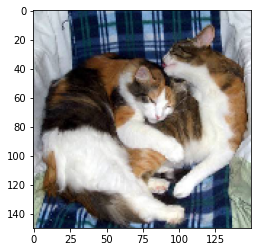

DOG


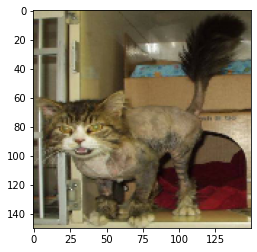

DOG


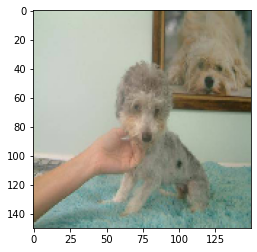

DOG


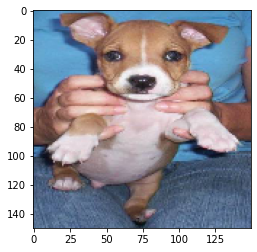

DOG


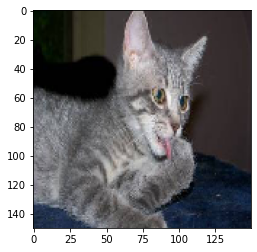

DOG


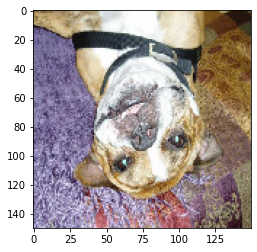

DOG


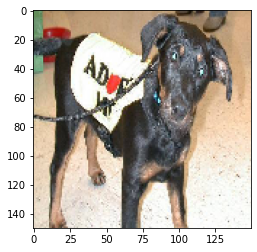

DOG


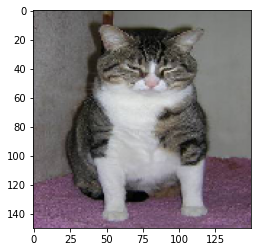

DOG


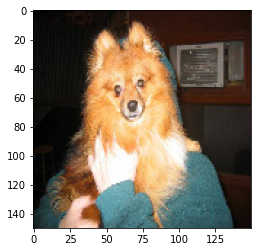

DOG


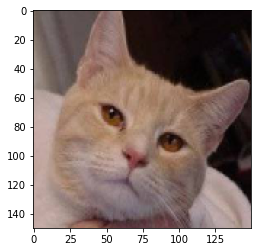

DOG


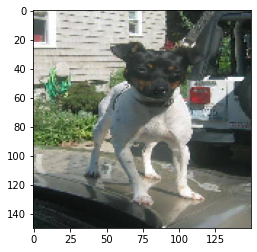

DOG


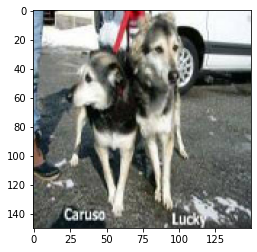

DOG


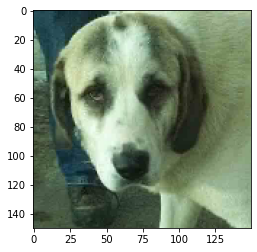

DOG


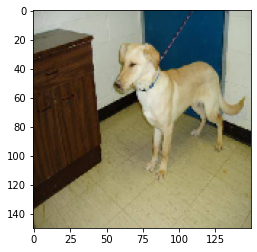

DOG


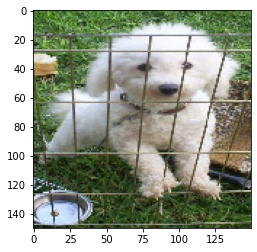

DOG


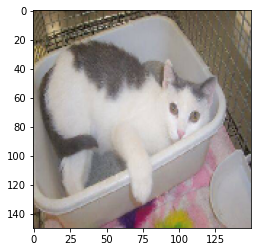

DOG


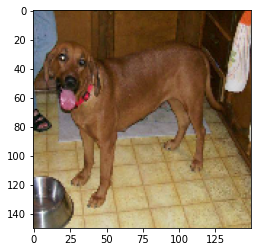

DOG


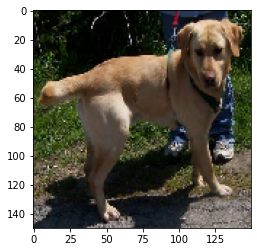

DOG


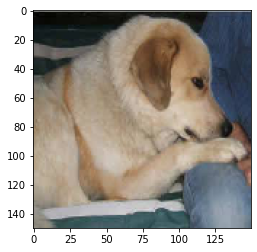

DOG


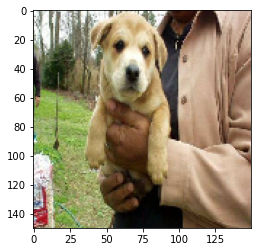

DOG


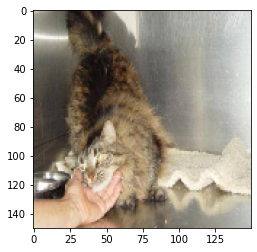

DOG


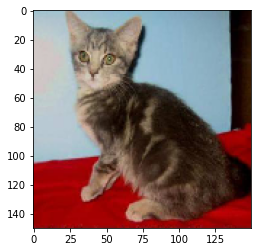

DOG


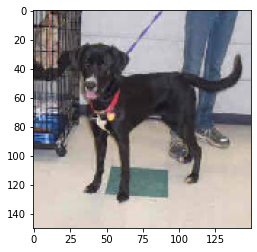

DOG


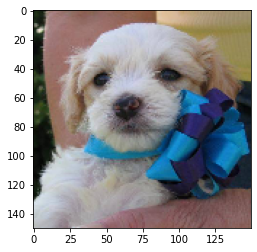

DOG


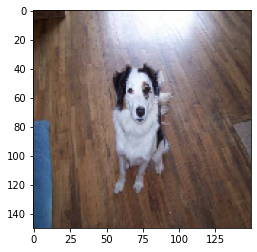

DOG


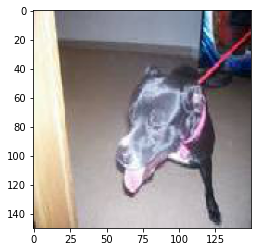

DOG


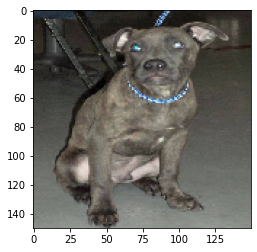

DOG


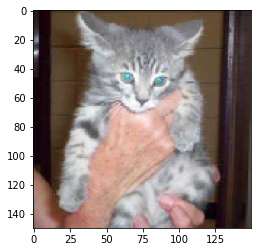

DOG


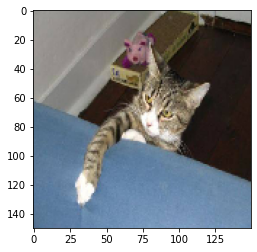

DOG


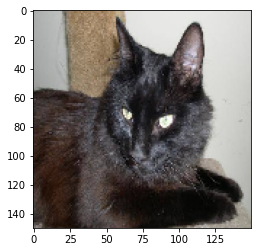

DOG


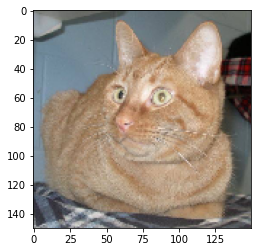

DOG


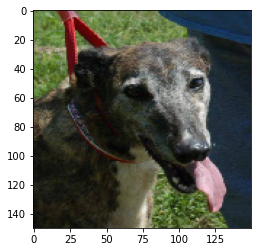

DOG


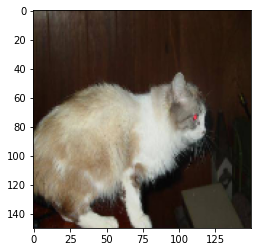

DOG


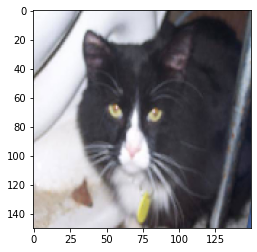

DOG


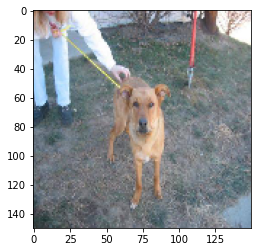

DOG


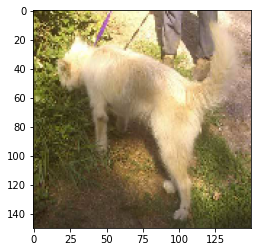

DOG


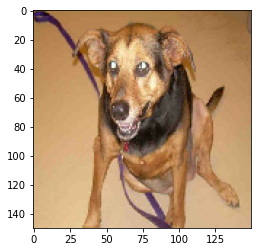

DOG


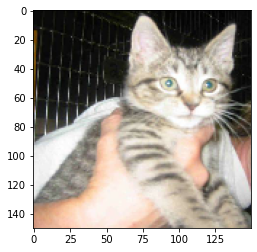

DOG


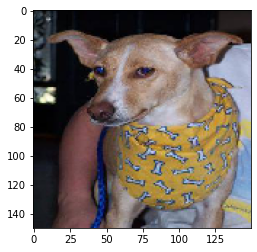

DOG


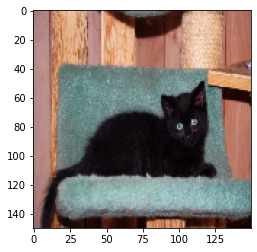

DOG


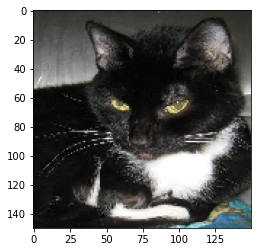

DOG


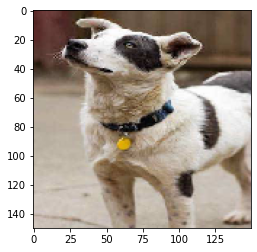

DOG


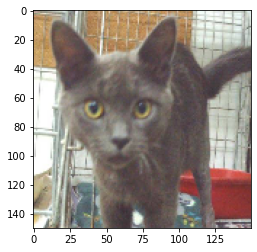

DOG


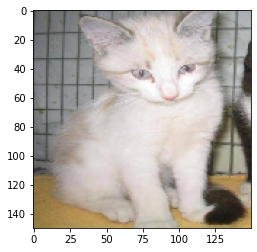

DOG


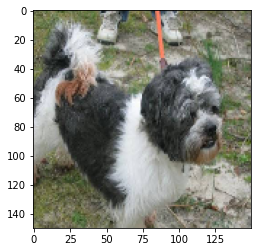

DOG


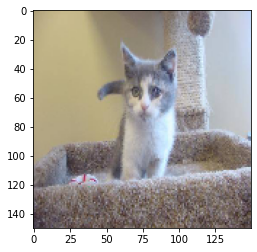

DOG


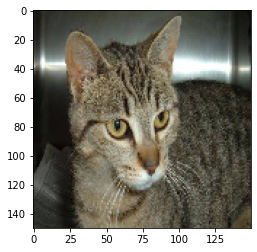

DOG


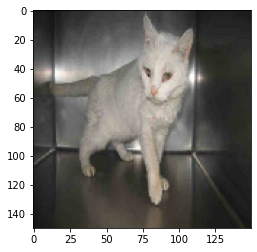

DOG


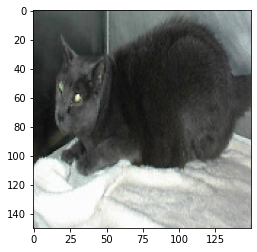

DOG


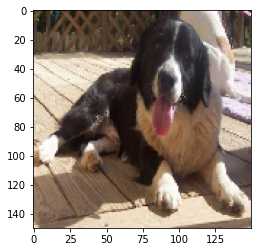

DOG


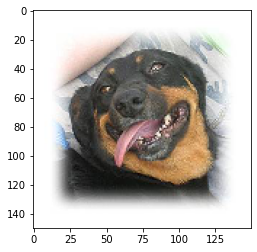

DOG


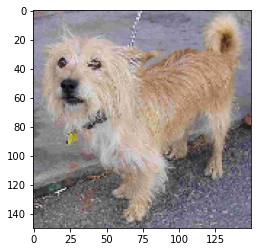

DOG


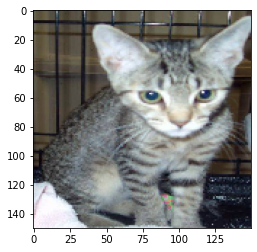

DOG


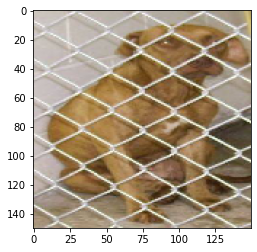

DOG


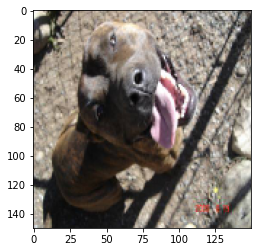

DOG


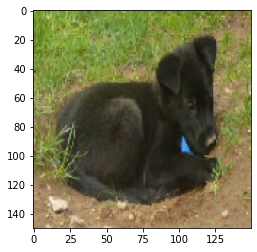

DOG


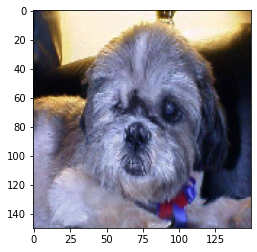

DOG


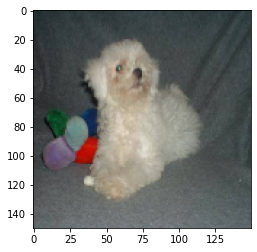

DOG


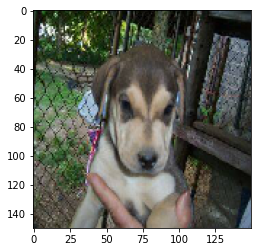

DOG


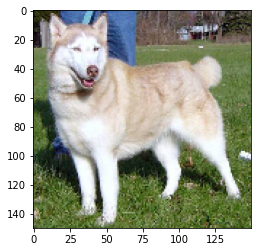

DOG


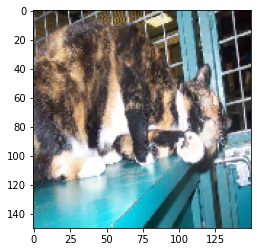

CAT


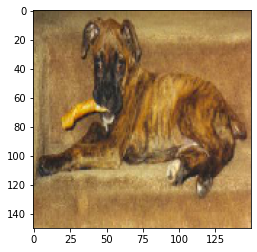

DOG


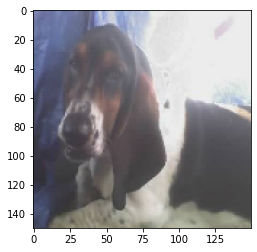

DOG


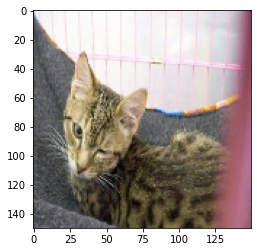

DOG


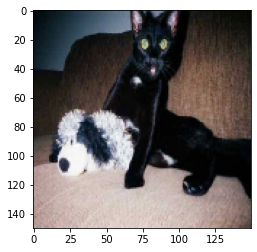

DOG


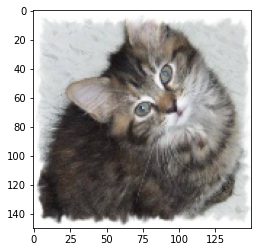

DOG


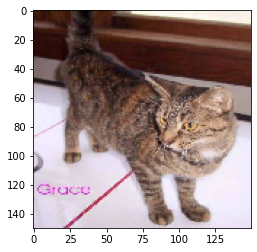

DOG


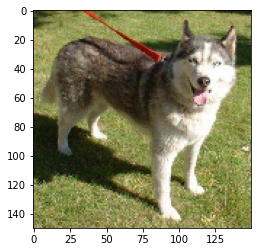

DOG


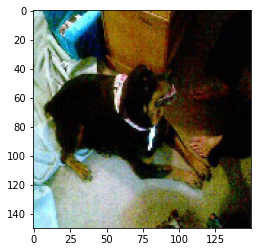

DOG


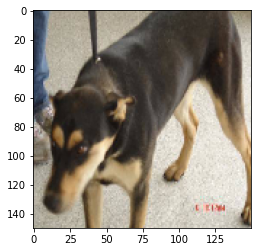

DOG


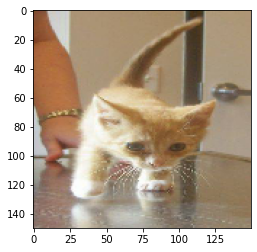

DOG


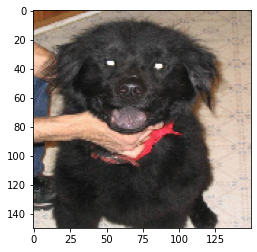

DOG


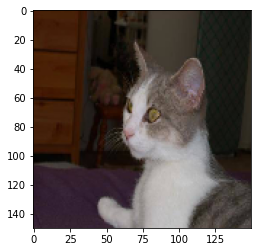

DOG


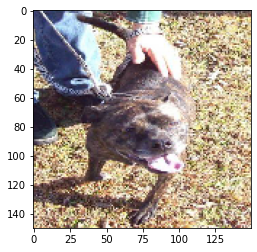

DOG


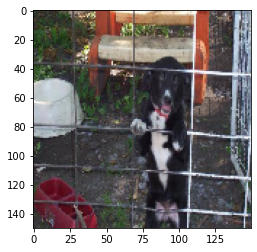

DOG


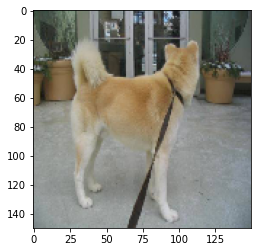

DOG


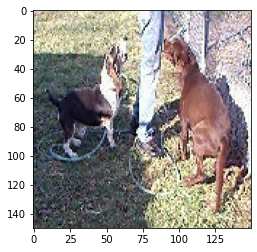

DOG


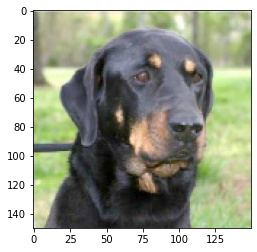

DOG


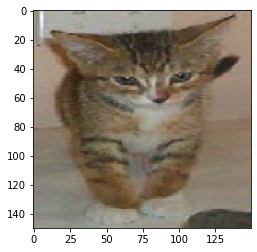

DOG


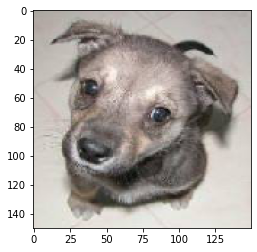

DOG


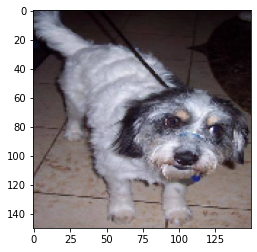

DOG


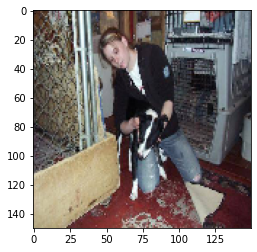

DOG


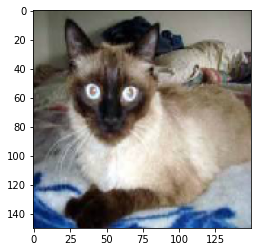

DOG


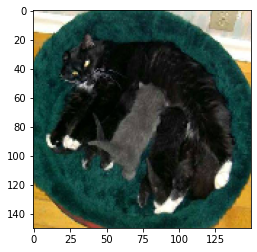

DOG


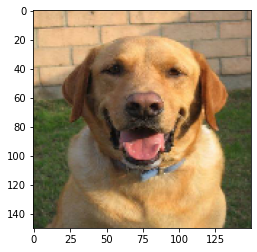

DOG


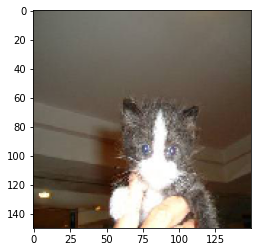

DOG


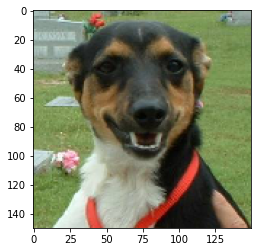

DOG


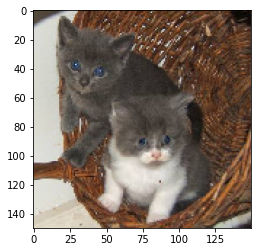

DOG


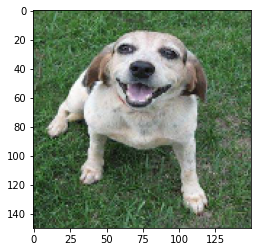

DOG


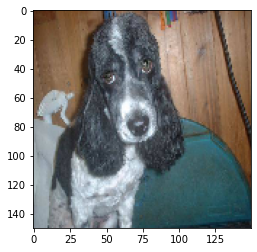

DOG


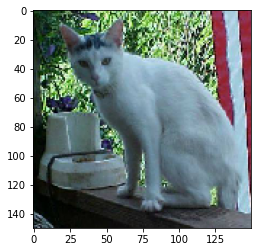

DOG


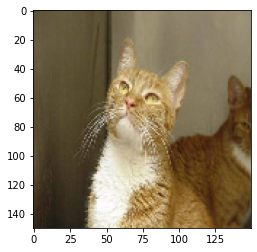

DOG


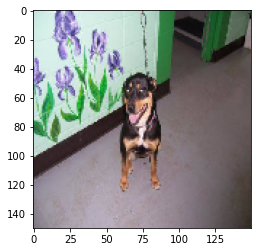

DOG


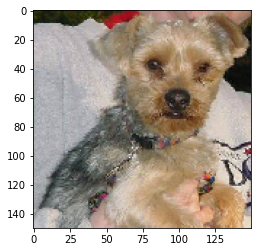

DOG


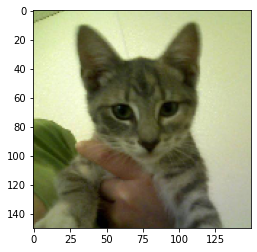

DOG


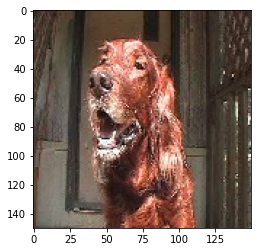

DOG


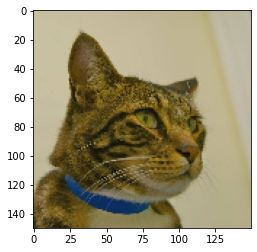

DOG


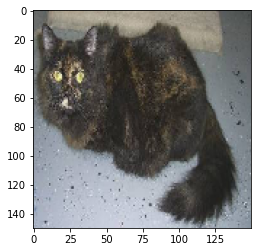

DOG


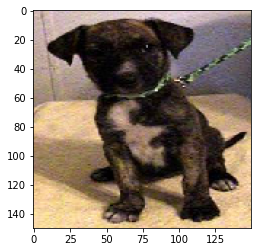

DOG


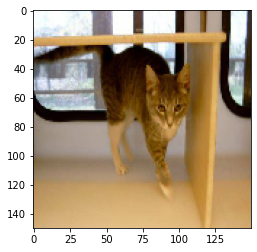

DOG


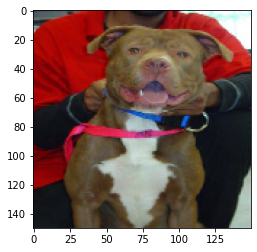

DOG


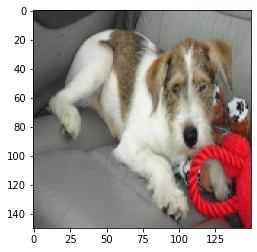

DOG


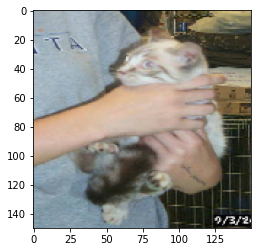

DOG


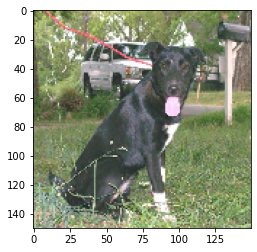

DOG


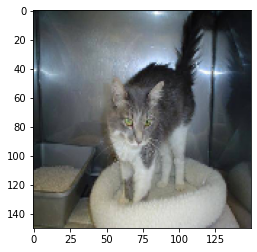

DOG


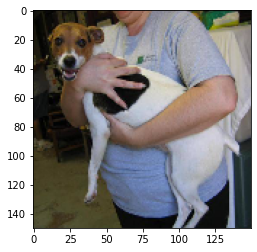

DOG


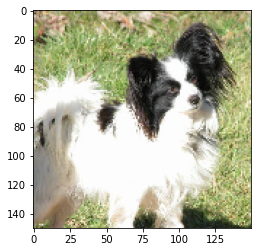

DOG


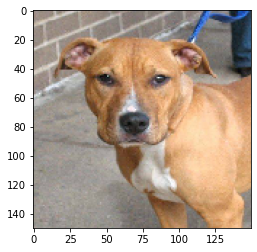

DOG


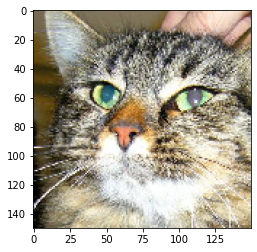

DOG


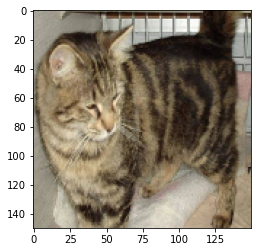

DOG


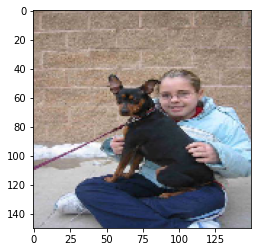

DOG


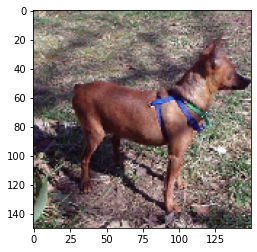

DOG


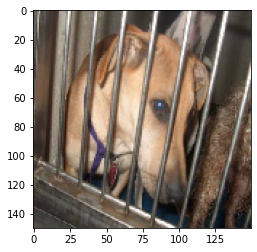

DOG


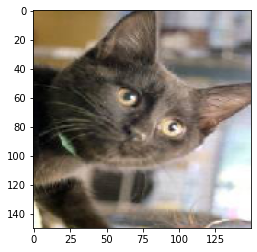

DOG


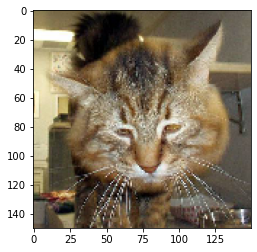

DOG


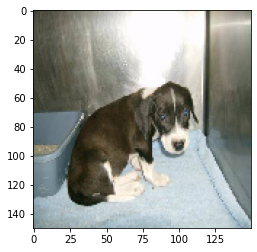

DOG


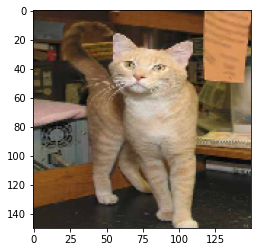

DOG


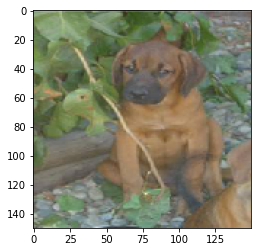

DOG


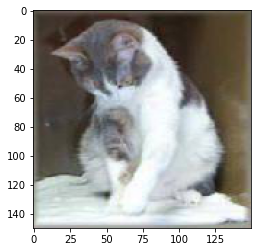

DOG


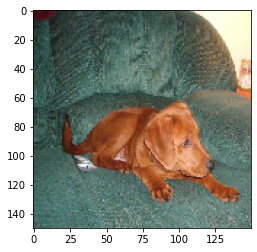

DOG


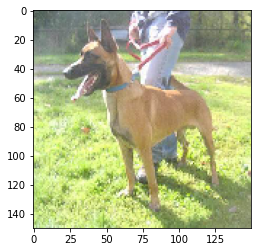

DOG


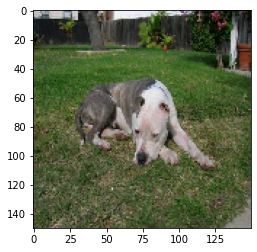

DOG


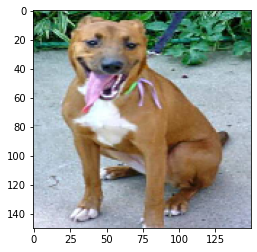

In [ ]:
for i in os.listdir(dir_path):
    img= image.load_img(dir_path+'//'+i,target_size=(150,150))
    plt.imshow(img)
    plt.show()
    X= image.img_to_array(img)
    X=np.expand_dims(X,axis=0)
    images=np.vstack([X])
    val = model.predict(images)
    if val ==0:
        print("CAT")
    else:
        print("DOG")